# Compare of Different Image Preprocess Method
# 对比不同图像预处理方式


In this notebook, we mainly compare the following 2 preprocess method(我们主要对比了以下2种图像预处理方式):

- based on single image （对每张图像单独预处理）
- based on batch （对整体数据集进行预处理）


In [1]:
import matplotlib.pyplot as plt
import cv2
from glob import glob
import numpy as np
import math
%matplotlib inline

## Dataset Path

In [2]:
dataset_path='E:\\taha\\code\\Retina-VesselNet\\STARE-labeled\\'   # modify the dataset_path to your own dir（将dataset_path修改至你自己的路径）

train_dir=dataset_path
test_dir=dataset_path

train_image_dir=train_dir+"stare-images\\"
train_mask_dir=train_dir+"mask\\"
train_groundtruth_dir=train_dir+"labels-ah\\"
train_patch_dir=train_dir+"patch\\"

test_image_dir=test_dir+"stare-images\\"
test_mask_dir=test_dir+"mask\\"
test_save_dir=test_dir+"pred_result_ilo\\"

train_image_path_list=glob(train_image_dir+"*.ppm")
test_image_path_list=glob(test_image_dir+"*.ppm")


## Before Start

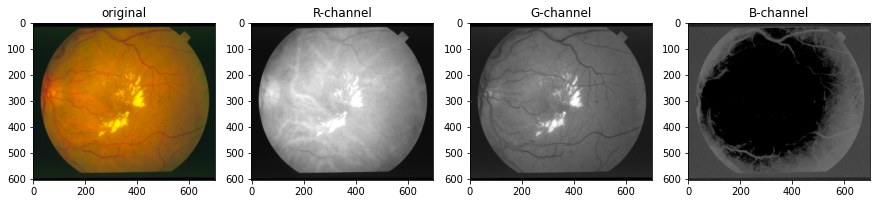

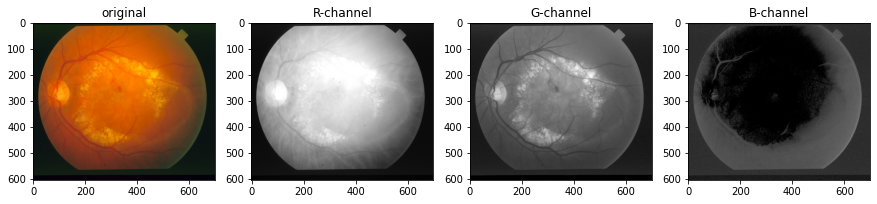

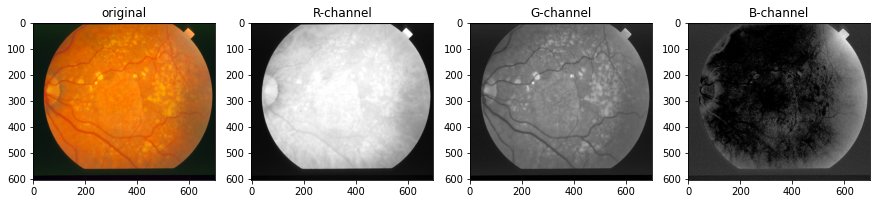

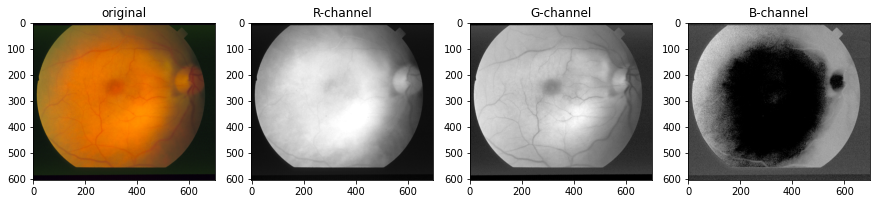

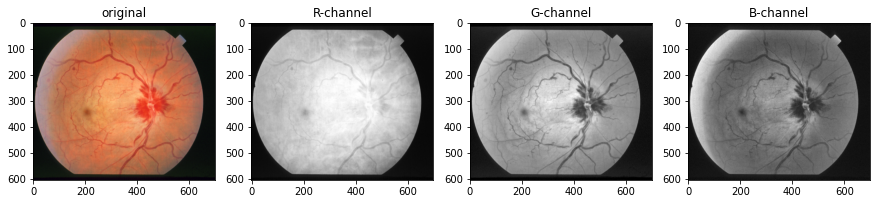

In [3]:
for image_path in train_image_path_list[:5]:
  image=plt.imread(image_path)

  plt.figure(figsize=(15,15))
  plt.subplot(141)
  plt.title("original")
  plt.imshow(image)
  plt.subplot(142)
  plt.title("R-channel")
  plt.imshow(image[:,:,0],cmap=plt.cm.gray)
  plt.subplot(143)
  plt.title("G-channel")
  plt.imshow(image[:,:,1],cmap=plt.cm.gray)
  plt.subplot(144)
  plt.title("B-channel")
  plt.imshow(image[:,:,2],cmap=plt.cm.gray)
  plt.show()

## A. Based on Single Image

In [180]:
def normal_normalized_single(imgs,mask):
    imgs_normalized = np.empty(imgs.shape)
    imgs_std = np.std(imgs)
    imgs_mean = np.mean(imgs)
    imgs_normalized = (imgs-imgs_mean)/imgs_std
    for i in range(imgs.shape[2]):
        imgs_normalized[:,:,i] = ((imgs_normalized[:,:,i] - np.min(imgs_normalized[:,:,i])) / (np.max(imgs_normalized[:,:,i])-np.min(imgs_normalized[:,:,i])))*255
    return imgs_normalized


# CLAHE (Contrast Limited Adaptive Histogram Equalization)
#adaptive histogram equalization is used. In this, image is divided into small blocks called "tiles" (tileSize is 8x8 by default in OpenCV). Then each of these blocks are histogram equalized as usual. So in a small area, histogram would confine to a small region (unless there is noise). If noise is there, it will be amplified. To avoid this, contrast limiting is applied. If any histogram bin is above the specified contrast limit (by default 40 in OpenCV), those pixels are clipped and distributed uniformly to other bins before applying histogram equalization. After equalization, to remove artifacts in tile borders, bilinear interpolation is applied
def clahe_equalized_single(imgs):
  clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
  imgs_equalized = np.empty(imgs.shape)
  for i in range(imgs.shape[2]):
    imgs_equalized[:,:,i] = clahe.apply(np.array(imgs[:,:,i], dtype = np.uint8))
  return imgs_equalized


def adjust_gamma_single(imgs, gamma=1.0):
  invGamma = 1.0 / gamma
  table = np.array([((i / 255.0) ** invGamma) * 255 for i in np.arange(0, 256)]).astype("uint8")
  # apply gamma correction using the lookup table
  new_imgs = np.empty(imgs.shape)
  for i in range(imgs.shape[2]):
    new_imgs[:,:,i] = cv2.LUT(np.array(imgs[:,:,i], dtype = np.uint8), table)
  return new_imgs

def preprocess_single(image,mask):
  
  assert np.max(mask)==1
  image=np.array(image)
  image[:,:,0]=image[:,:,0]*mask
  image[:,:,1]=image[:,:,1]*mask
  image[:,:,2]=image[:,:,2]*mask
  
  image=normal_normalized_single(image,mask)
  image=clahe_equalized_single(image)
  image=adjust_gamma_single(image,1.2)
  image=morpho(image)
  # image=normal_normalized_single(image,mask)
  # image=clahe_equalized_single(image)
  # image=adjust_gamma_single(image,1.3)
  image=image/255.0
  return image

def morpho(img):
  (R,G,B) = cv2.split(img)
   
  opening_kernel_size =7
  # kernel = np.ones((size, 1), np.uint8)

  # Calculate the maximum response of 12 directions
  opening_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (opening_kernel_size, 1)).astype(np.uint8)  # Ensure the data type is uint8

  topsG = []
  topsR = []
  topsB = []
  for angle in range(0, 180, 15):
      mat = cv2.getRotationMatrix2D((opening_kernel_size // 2, 0), angle, 1)
      topsR.append(cv2.morphologyEx(R, cv2.MORPH_TOPHAT, opening_kernel, mat))
      topsG.append(cv2.morphologyEx(G, cv2.MORPH_TOPHAT, opening_kernel, mat))
      topsB.append(cv2.morphologyEx(B, cv2.MORPH_TOPHAT, opening_kernel, mat))

  R1 = np.max(topsR, axis=0)
  G1 = np.max(topsG, axis=0)
  B1 = np.max(topsB, axis=0)

  # R1 = cv2.GaussianBlur(R1, (5, 5), 0)
  # G1 = cv2.GaussianBlur(G1, (5, 5), 0)
  # B1 = cv2.GaussianBlur(B1, (5, 5), 0)

  R7 = R + R1
  G7 = G + G1
  B7 = B + B1

  R7 = cv2.GaussianBlur(R7, (5, 5), 0)
  G7 = cv2.GaussianBlur(G7, (3, 3), 0)
  B7 = cv2.GaussianBlur(B7, (3, 3), 0)

  img2 = cv2.merge([R7,G7,B7])
  # img2 = cv2.GaussianBlur(img2, (5, 5), 0)
  # print(type(img2))
  # print(img2.shape)
  # img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)

  return img2


im0001


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


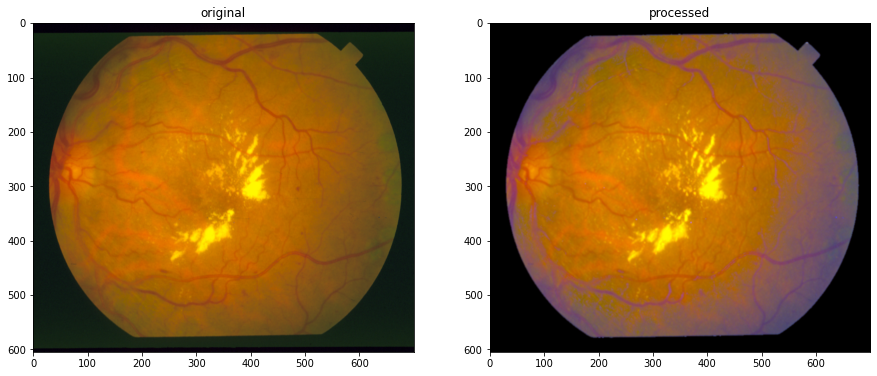

im0002


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


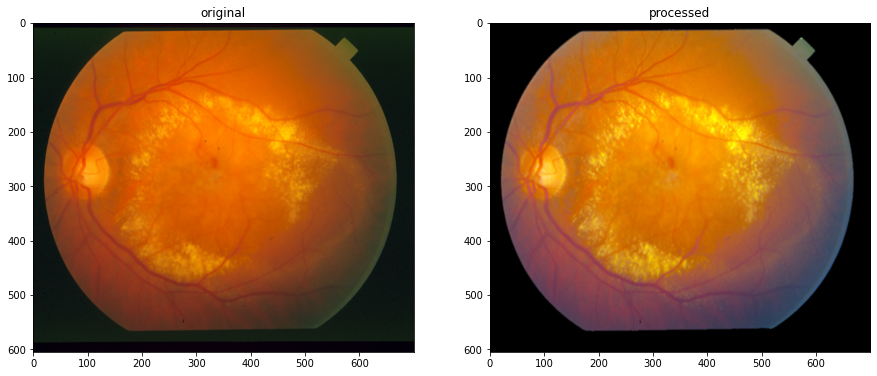

im0003


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


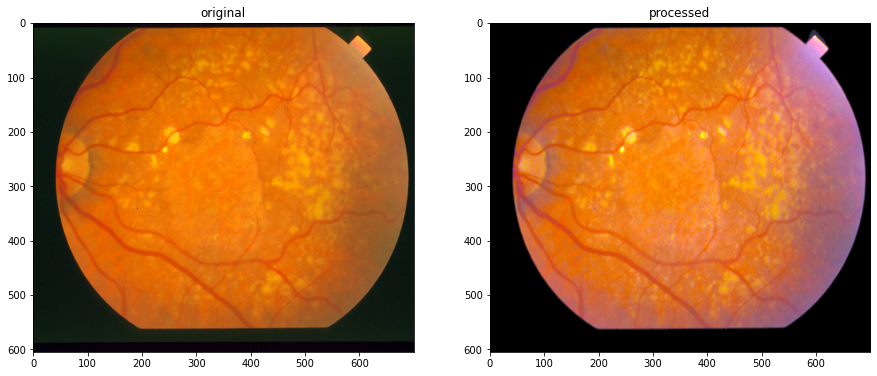

im0004


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


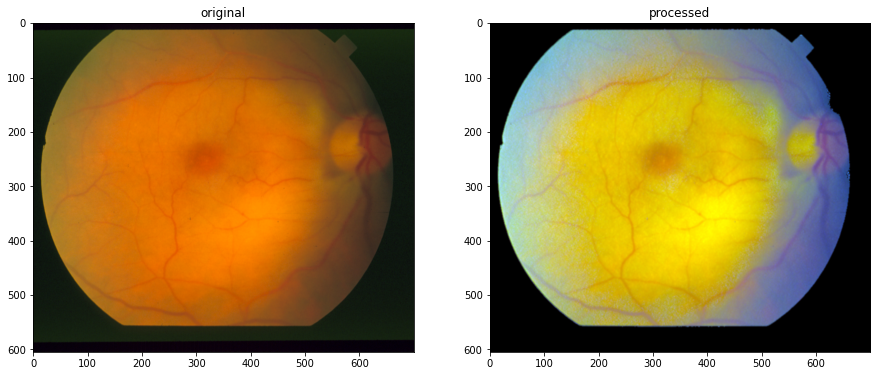

im0005


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


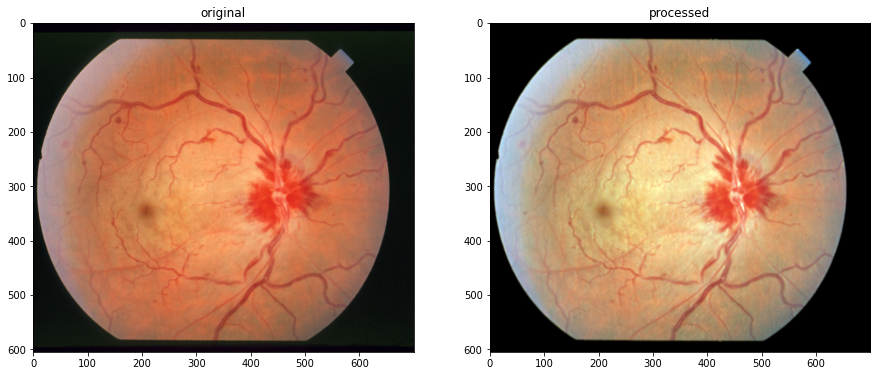

In [181]:
method_A_list=[]

for image_path in train_image_path_list[:5]:
  image_name=image_path.split("\\")[-1].split(".")[0]

  image=plt.imread(image_path)
  print(image_name)

  mask=plt.imread(train_mask_dir+image_name+"_mask.gif")
  mask = mask[:,:,0]
  mask=np.where(mask>0,1,0)
  image_original=image.copy()
  image_processed=preprocess_single(image,mask)
  image_processed_binary=np.asarray(0.2*image_processed[:,:,0]+0.8*image_processed[:,:,1])

  
  plt.figure(figsize=(15,15))
  plt.subplot(121)
  plt.title("original")
  plt.imshow(image_original)
  plt.subplot(122)
  plt.title("processed")
  plt.imshow(image_processed)
  # plt.subplot(133)
  # plt.title("0.25*B+0.75*G")
  # plt.imshow(image_processed_binary,cmap=plt.cm.gray)
  plt.show()
  
  image_processed_binary=np.expand_dims(image_processed_binary,0)
  method_A_list.append(image_processed_binary)

method_A=np.concatenate(method_A_list,axis=0)

## B. Based on  Dataset

In [6]:
def rgb2gray(rgb):
    assert (len(rgb.shape) == 4)  # 4D arrays
    assert (rgb.shape[1] == 3)
    bn_imgs = rgb[:, 1, :, :] * 0.75 + rgb[:, 2, :, :] * 0.25
    bn_imgs = np.reshape(bn_imgs, (rgb.shape[0], 1, rgb.shape[2], rgb.shape[3]))
    return bn_imgs

def preprocess_batch(data):
    assert (len(data.shape) == 4)
    assert (data.shape[1] == 3)  # Use the original images
    train_imgs = rgb2gray(data)
    # my preprocessing:
    train_imgs = dataset_normalized_batch(train_imgs)
    train_imgs = clahe_equalized_batch(train_imgs)
    train_imgs = adjust_gamma_batch(train_imgs, 1.2)
    train_imgs = train_imgs / 255.  # reduce to 0-1 range
    return train_imgs


# ============================================================
# ========= PRE PROCESSING FUNCTIONS ========================#
# ============================================================

# ==== histogram equalization
def histo_equalized_batch(imgs):
    assert (len(imgs.shape) == 4)  # 4D arrays
    assert (imgs.shape[1] == 1)  # check the channel is 1
    imgs_equalized = np.empty(imgs.shape)
    for i in range(imgs.shape[0]):
        imgs_equalized[i, 0] = cv2.equalizeHist(np.array(imgs[i, 0], dtype=np.uint8))
    return imgs_equalized


# CLAHE (Contrast Limited Adaptive Histogram Equalization)
# adaptive histogram equalization is used. In this, image is divided into small blocks called "tiles" (tileSize is 8x8 by default in OpenCV). Then each of these blocks are histogram equalized as usual. So in a small area, histogram would confine to a small region (unless there is noise). If noise is there, it will be amplified. To avoid this, contrast limiting is applied. If any histogram bin is above the specified contrast limit (by default 40 in OpenCV), those pixels are clipped and distributed uniformly to other bins before applying histogram equalization. After equalization, to remove artifacts in tile borders, bilinear interpolation is applied
def clahe_equalized_batch(imgs):
    assert (len(imgs.shape) == 4)  # 4D arrays
    # assert (imgs.shape[1]==1)  #check the channel is 1
    # create a CLAHE object (Arguments are optional).
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    imgs_equalized = np.empty(imgs.shape)
    for i in range(imgs.shape[0]):
        imgs_equalized[i, 0] = clahe.apply(np.array(imgs[i, 0], dtype=np.uint8))
    return imgs_equalized


# ===== normalize over the dataset
def dataset_normalized_batch(imgs):
    assert (len(imgs.shape) == 4)  # 4D arrays
    # assert (imgs.shape[1]==1)  #check the channel is 1
    imgs_normalized = np.empty(imgs.shape)
    imgs_std = np.std(imgs)
    imgs_mean = np.mean(imgs)
    imgs_normalized = (imgs - imgs_mean) / imgs_std
    for i in range(imgs.shape[0]):
        imgs_normalized[i] = ((imgs_normalized[i] - np.min(imgs_normalized[i])) / (
                    np.max(imgs_normalized[i]) - np.min(imgs_normalized[i]))) * 255
    return imgs_normalized


def adjust_gamma_batch(imgs, gamma=1.0):
    assert (len(imgs.shape) == 4)  # 4D arrays
    # assert (imgs.shape[1]==1)  #check the channel is 1
    # build a lookup table mapping the pixel values [0, 255] to
    # their adjusted gamma values
    invGamma = 1.0 / gamma
    table = np.array([((i / 255.0) ** invGamma) * 255 for i in np.arange(0, 256)]).astype("uint8")
    # apply gamma correction using the lookup table
    new_imgs = np.empty(imgs.shape)
    for i in range(imgs.shape[0]):
        new_imgs[i, 0] = cv2.LUT(np.array(imgs[i, 0], dtype=np.uint8), table)
    return new_imgs


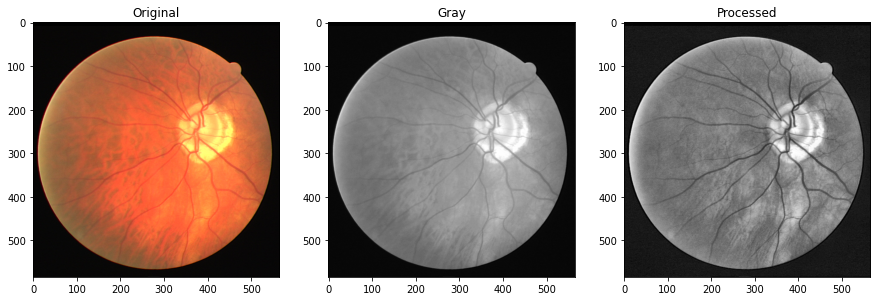

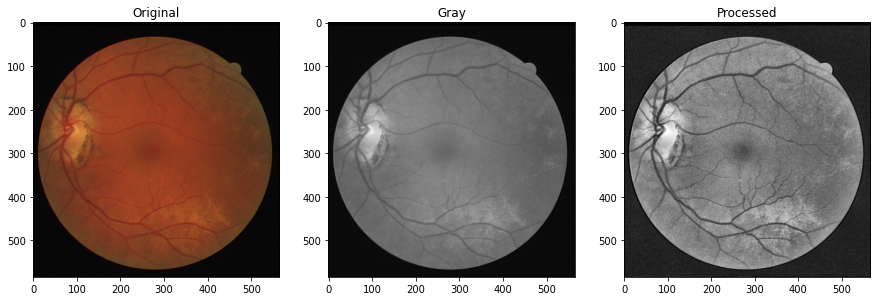

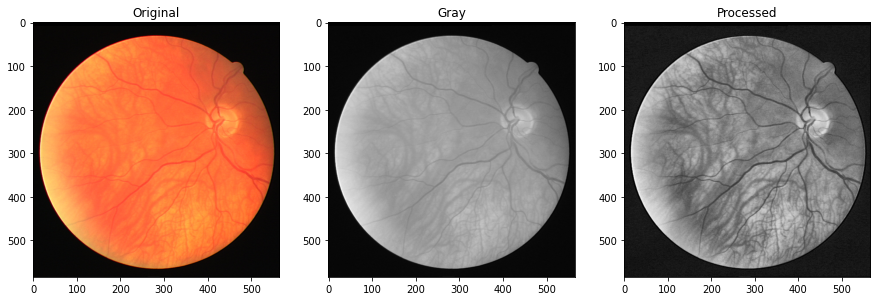

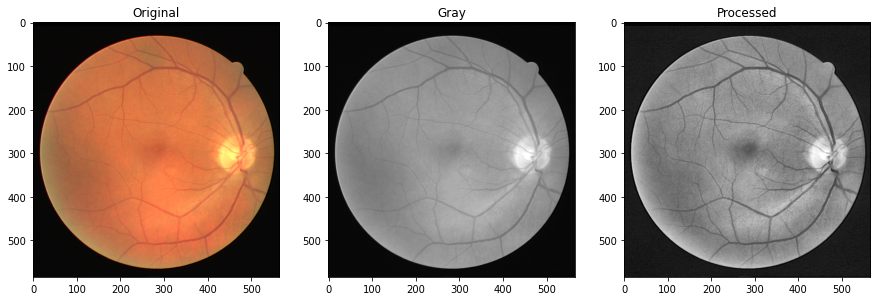

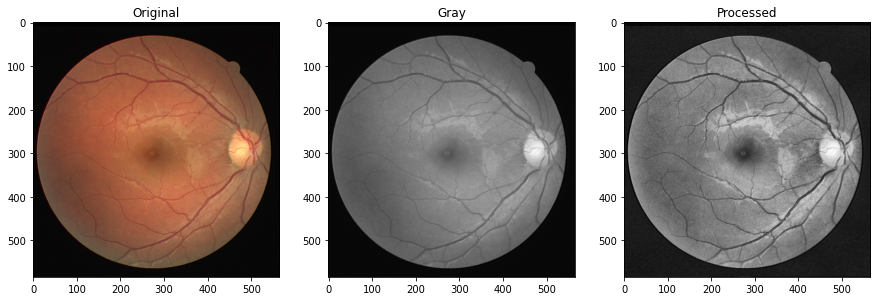

...

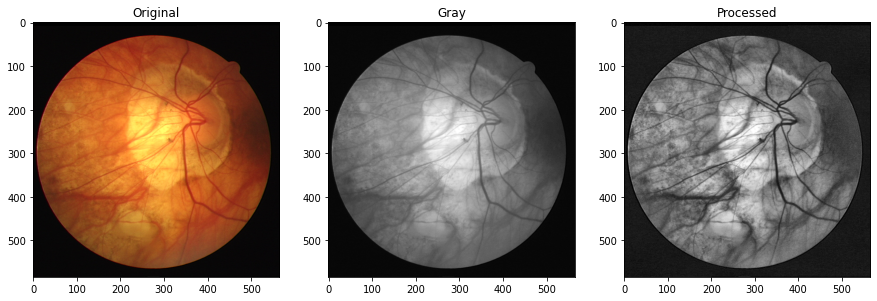

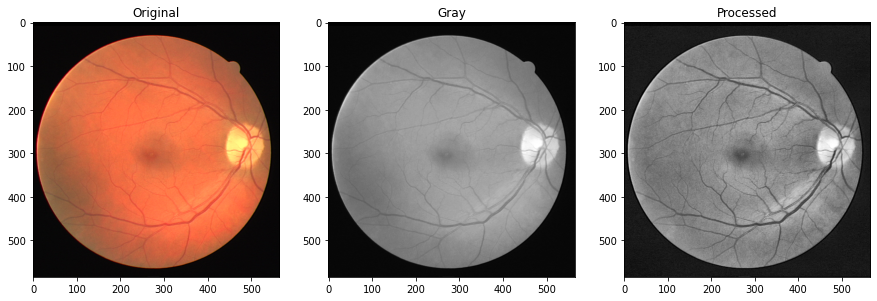

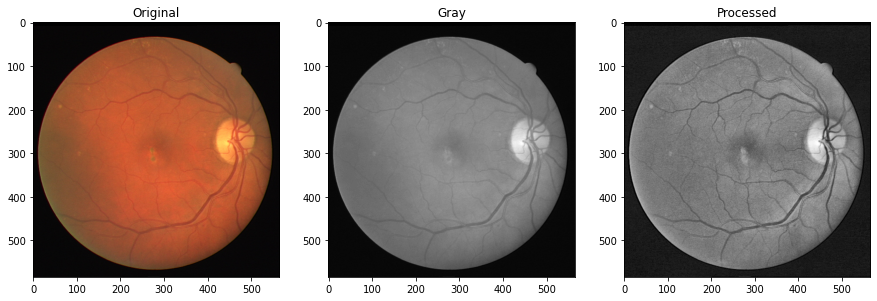

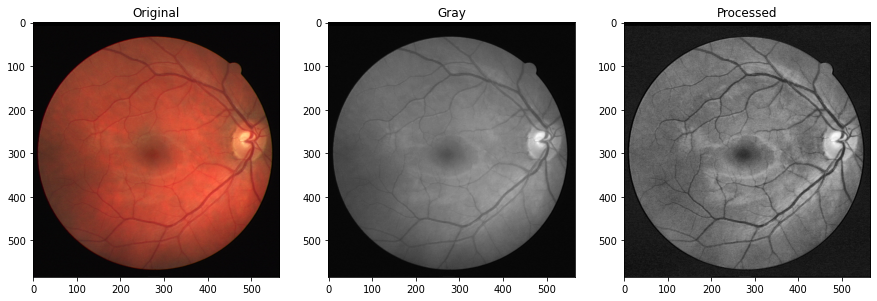

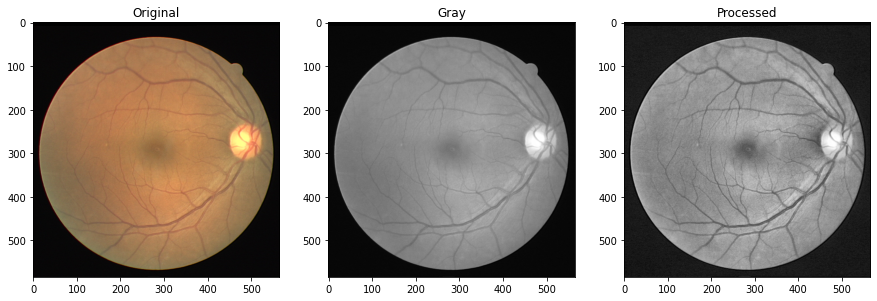

In [7]:
image_list=[]
for image_path in train_image_path_list:
  image_name=image_path.split("/")[-1].split("_")[0]

  image=plt.imread(image_path)
  image=np.expand_dims(image,0)
  image_list.append(image)

image_batch=np.concatenate(image_list,axis=0)
image_batch_transpose=image_batch.transpose(0,3,1,2)

processed_batch=preprocess_batch(image_batch_transpose)
processed_batch=processed_batch.transpose(0,2,3,1)

for i in range(processed_batch.shape[0]):
    
    gray=image_batch[i, :, :, 0] * 0.299 + image_batch[i, :, :, 1] * 0.587 + image_batch[i, :, :, 2] * 0.114
    
    plt.figure(figsize=(15,15))
    plt.subplot(131)
    plt.title("Original")
    plt.imshow(image_batch[i])
    plt.subplot(132)
    plt.title("Gray")
    plt.imshow(gray,cmap=plt.cm.gray)
    plt.subplot(133)
    plt.title("Processed")
    plt.imshow(processed_batch[i],cmap=plt.cm.gray)
    plt.show()

method_B=processed_batch

## Compare Method A and B

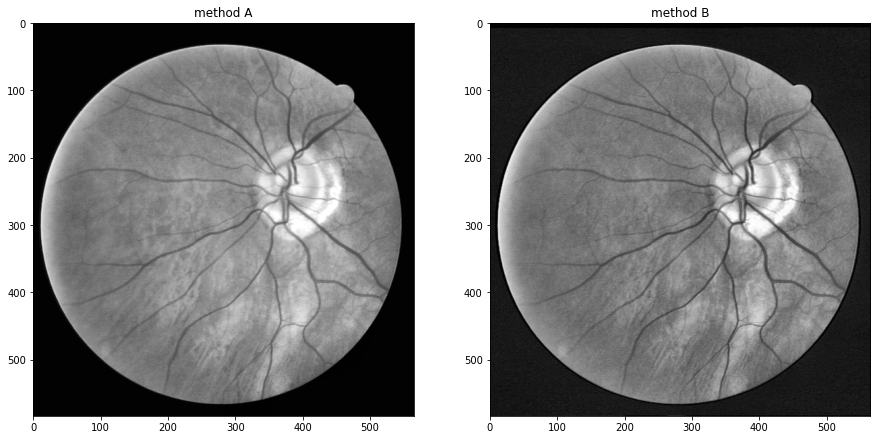

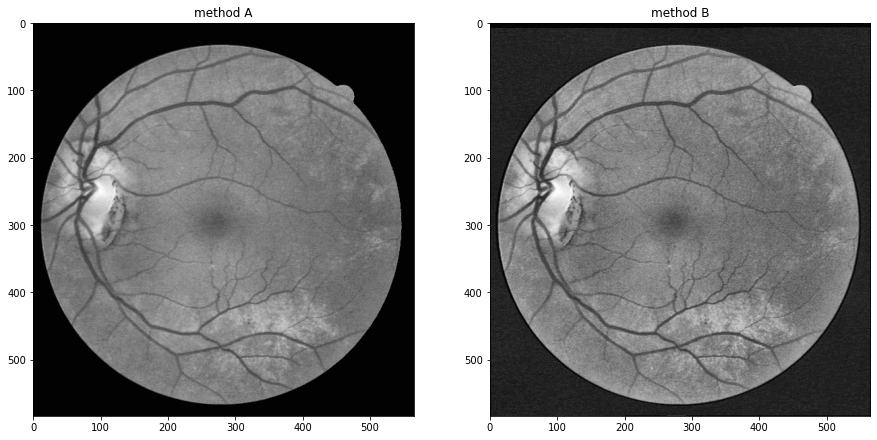

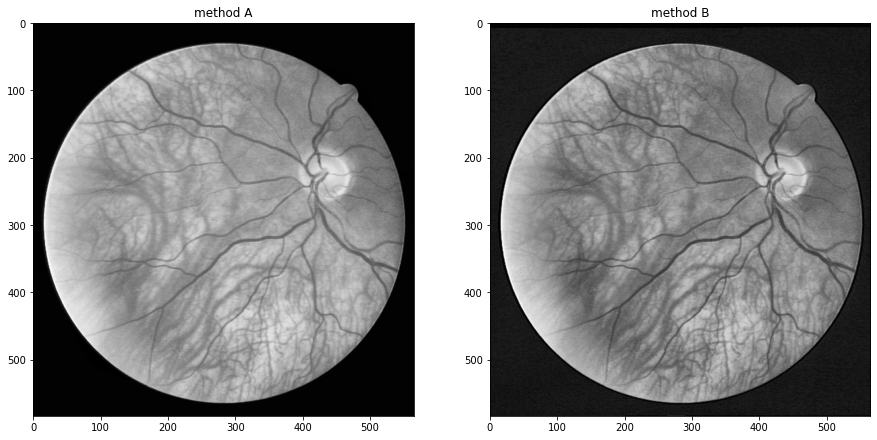

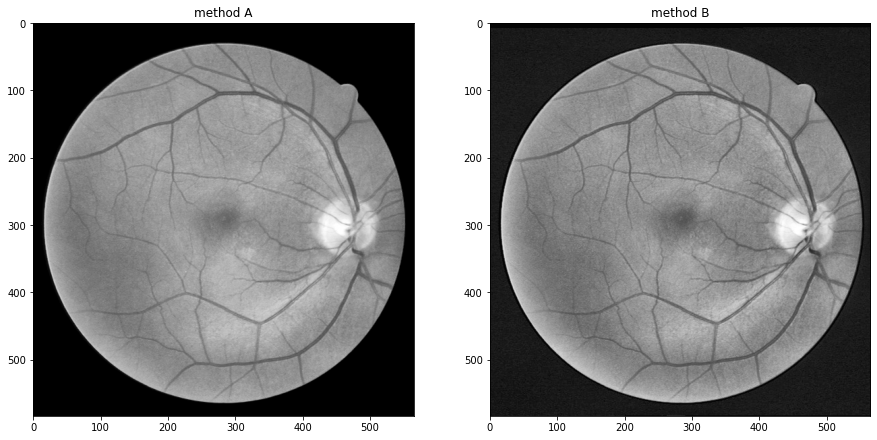

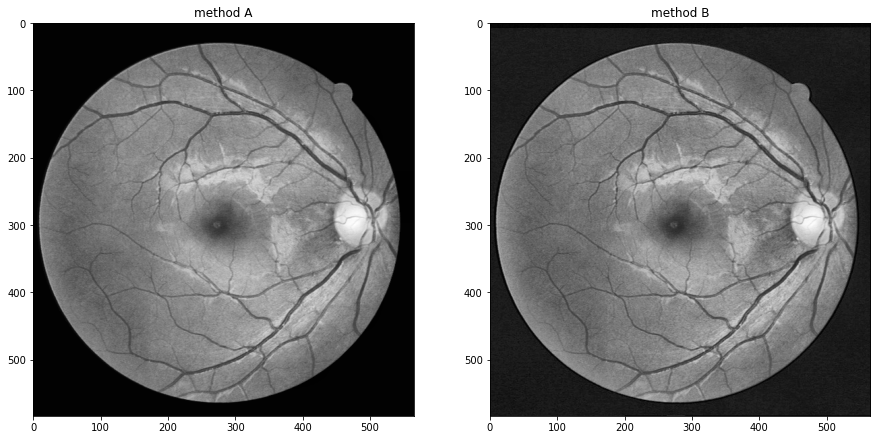

...

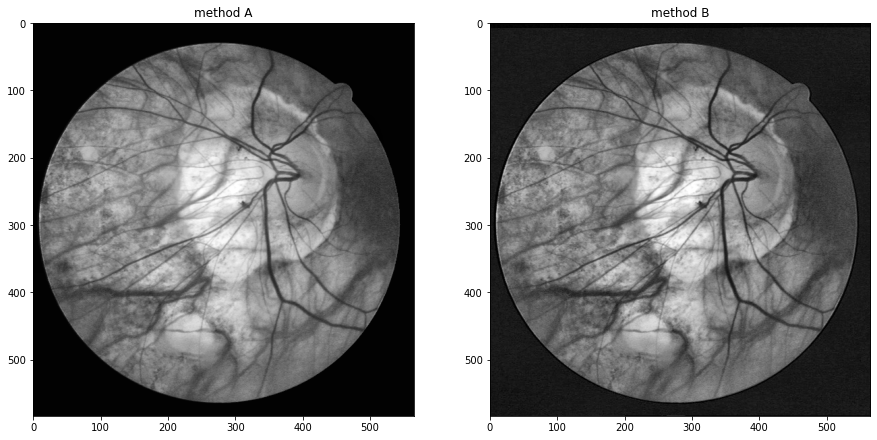

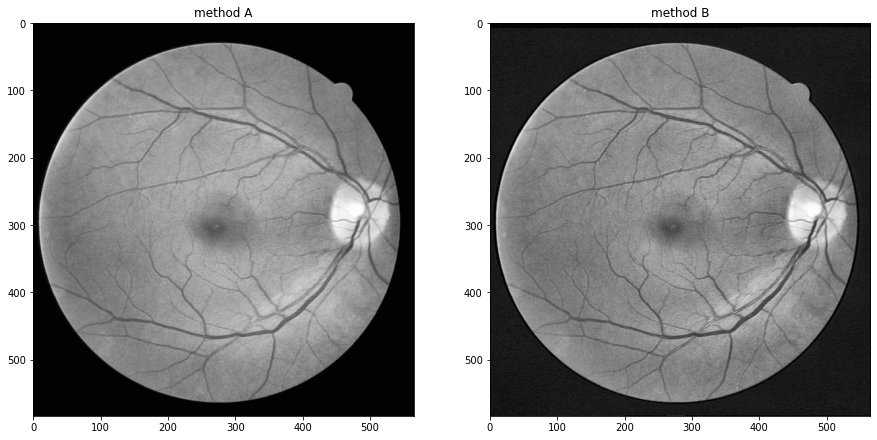

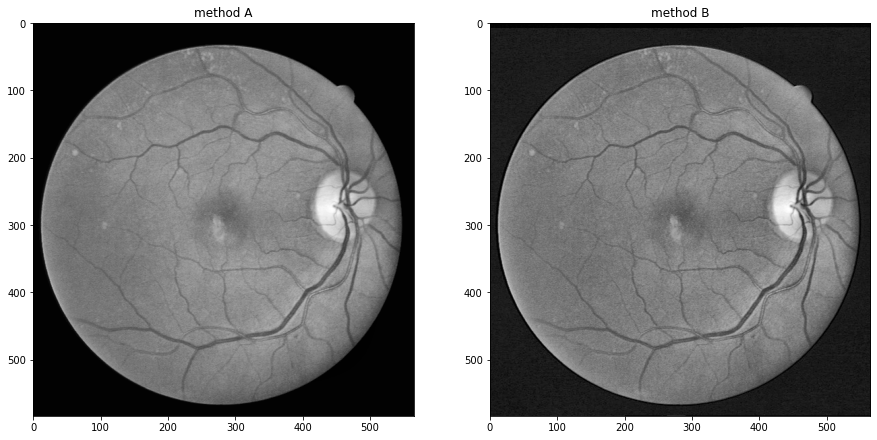

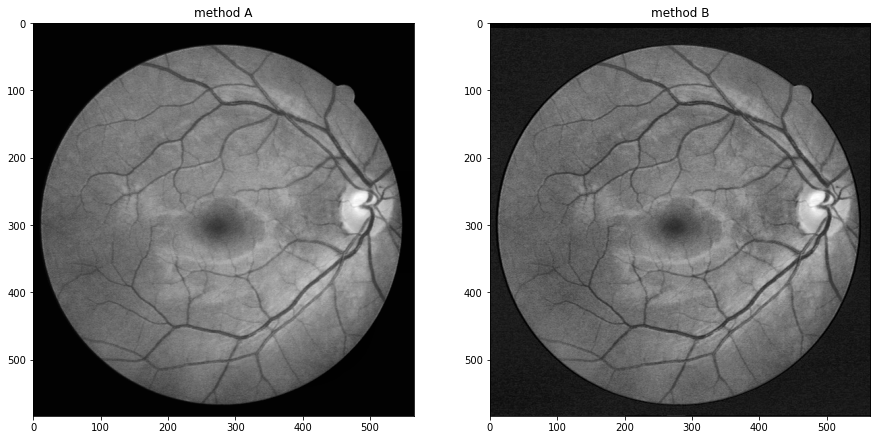

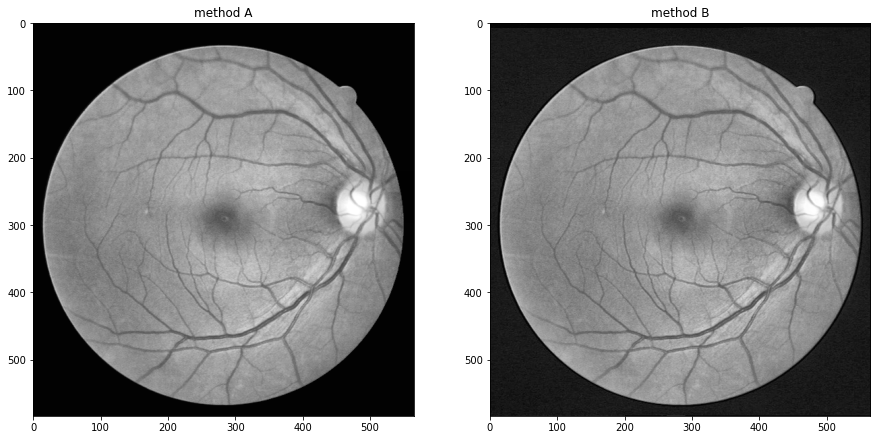

In [8]:
for i in range(method_A.shape[0]):
    plt.figure(figsize=(15,15))
    plt.subplot(121)
    plt.title("method A")
    plt.imshow(method_A[i],cmap=plt.cm.gray)
    plt.subplot(122)
    plt.title("method B")
    plt.imshow(method_B[i],cmap=plt.cm.gray)
    plt.show()